In [18]:
# Importing all the necessary libraries for the project
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array, array_to_img
import keras
from tensorflow.keras.metrics import AUC, TruePositives, TrueNegatives, FalsePositives, FalseNegatives, Accuracy, CategoricalAccuracy
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


#Open image using Image module
from PIL import Image

# importing the 'zipfile' module
import zipfile
 

# Load the TensorBoard notebook extension
%load_ext tensorboard
from tensorboard.plugins.hparams import api as hp

# Set seed to 42 to have similar results
import random as python_random
import random
np.random.seed(42)
python_random.seed(42)
tf.random.set_seed(42)

# Use scikit-learn to get statistics
import sklearn.metrics as metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# importing seaborn and matplotlib for statistical data visualization
import seaborn as sn
import matplotlib.pyplot as plt

# importing shutil module
import shutil
from shutil import copyfile

# importing os module
import os
from os import getcwd

import nltk
import pickle

from tensorflow.keras.utils import plot_model


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [19]:
# Show tensorflow version
print(tf.__version__)
 
# check GPU version of tensorflow
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

2.5.0
Tue Aug 10 07:25:21 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    32W / 250W |   4641MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-

In [20]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Processing

In [4]:
!wget --no-check-certificate \
    https://github.com/abdo-projects/data-science-portfolio/raw/main/Dataset/Markisa_v2.zip \
    -O /tmp/Markisa_v2.zip

--2021-08-10 03:59:10--  https://github.com/abdo-projects/data-science-portfolio/raw/main/Dataset/Markisa_v2.zip
Resolving github.com (github.com)... 52.69.186.44
Connecting to github.com (github.com)|52.69.186.44|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/abdo-projects/data-science-portfolio/main/Dataset/Markisa_v2.zip [following]
--2021-08-10 03:59:11--  https://raw.githubusercontent.com/abdo-projects/data-science-portfolio/main/Dataset/Markisa_v2.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16392079 (16M) [application/zip]
Saving to: ‘/tmp/Markisa_v2.zip’

/tmp/Markisa_v2.zip 100%[===================>]  15.63M  37.9MB/s    in 0.4s    

2021-08-10 03:59:14 (37.9 MB/s) - ‘/tmp/Mark

In [5]:
local_zip = '/tmp/Markisa_v2.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Markisa_v2')

zip_ref.close()

In [6]:
# Directory with our training Markisa Besar pictures
train_besar_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Besar')

# Directory with our training Kuning pictures
train_kuning_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Kuning')

# Directory with our training Manis pictures
train_manis_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Manis')

# Directory with our training Ungu pictures
train_ungu_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/training_data/Markisa Ungu')




# Directory with our validation Besar pictures
validation_besar_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Besar')

# Directory with our validation Kuning pictures
validation_kuning_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Kuning')

# Directory with our validation Manis pictures
validation_manis_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Manis')

# Directory with our validation Ungu pictures
validation_ungu_dir = os.path.join('/tmp/Markisa_v2/Markisa_v2/validation_data/Markisa Ungu')

In [7]:
train_besar_names = os.listdir(train_besar_dir)
print(train_besar_names[:10])

train_kuning_names = os.listdir(train_kuning_dir)
print(train_kuning_names[:10])

train_manis_names = os.listdir(train_manis_dir)
print(train_manis_names[:10])

train_ungu_names = os.listdir(train_ungu_dir)
print(train_ungu_names[:10])



validation_besar_hames = os.listdir(validation_besar_dir)
print(validation_besar_hames[:10])

validation_kuning_names = os.listdir(validation_kuning_dir)
print(validation_kuning_names[:10])

validation_manis_hames = os.listdir(validation_manis_dir)
print(validation_manis_hames[:10])

validation_ungu_names = os.listdir(validation_ungu_dir)
print(validation_ungu_names[:10])

['aug_img_0_8505.jpeg', 'c2c51bb766ae695c45a5526da5dc4e80 (1).jpg', 'aug_img_0_6473.jpeg', 'aug_img_0_9930.jpeg', 'aug_img_0_2962.jpeg', 'aug_img_0_6795.jpeg', 'aug_img_0_5594.jpeg', 'aug_img_0_8632.jpeg', 'aug_img_0_7064.jpeg', 'aug_img_0_6908.jpeg']
['117.jpg', '83.jpg', '114.jpg', '134.jpg', '51.jpg', '39.jpg', '177.jpg', '137.jpg', '132.jpg', '127.jpg']
['IMG_20210506_195040.jpg', 'IMG_20210506_194925.jpg', 'IMG_20210506_193337.jpg', 'IMG_20210506_194803.jpg', 'IMG_20210506_194955.jpg', 'IMG_20210506_193658.jpg', 'IMG_20210506_194752.jpg', 'IMG_20210506_193501.jpg', 'IMG_20210506_195211.jpg', 'IMG_20210506_195149.jpg']
['IMG20210509192554.jpg', 'IMG20210509194119.jpg', 'IMG20210509200942.jpg', 'IMG20210509191808.jpg', 'IMG20210509192340.jpg', 'IMG20210509193050.jpg', 'IMG20210509191004.jpg', 'IMG20210509192922.jpg', 'IMG20210509164840.jpg', 'IMG20210509170130.jpg']
['markisa-jumbo.jpg', 'maxresdefault.jpg', 'PAS-GQU-72.jpg', 'images.jpg', 'images2.jpg', 'images (14).jpg', 'images (

In [8]:
print('total training besar images:', len(os.listdir(train_besar_dir)))
print('total training kuning images:', len(os.listdir(train_kuning_dir)))
print('total training manis images:', len(os.listdir(train_manis_dir)))
print('total training ungu images:', len(os.listdir(train_ungu_dir)))


print('total validation besar images:', len(os.listdir(validation_besar_dir)))
print('total validation kuning images:', len(os.listdir(validation_kuning_dir)))
print('total validation manis images:', len(os.listdir(validation_manis_dir)))
print('total validation ungu images:', len(os.listdir(validation_ungu_dir)))

total training besar images: 200
total training kuning images: 200
total training manis images: 200
total training ungu images: 200
total validation besar images: 25
total validation kuning images: 25
total validation manis images: 25
total validation ungu images: 25


In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 8

# Index for iterating over images
pic_index = 0

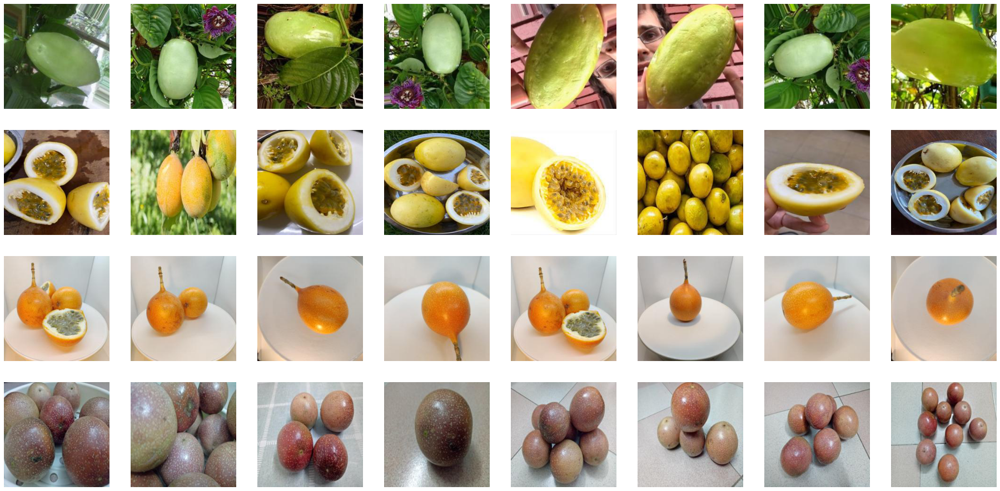

In [10]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_besar_pix = [os.path.join(train_besar_dir, fname) 
                for fname in train_besar_names[pic_index-8:pic_index]]
next_kuning_pix = [os.path.join(train_kuning_dir, fname) 
                for fname in train_kuning_names[pic_index-8:pic_index]]
next_manis_pix = [os.path.join(train_manis_dir, fname) 
                for fname in train_manis_names[pic_index-8:pic_index]]
next_ungu_pix = [os.path.join(train_ungu_dir, fname) 
                for fname in train_ungu_names[pic_index-8:pic_index]]


for i, img_path in enumerate(next_besar_pix+next_kuning_pix+next_manis_pix+next_ungu_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [11]:
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/tmp/Markisa_v2/Markisa_v2/training_data/',  # This is the source directory for training images
        target_size=(224, 224),  # All images will be resized to 224x224
        batch_size=32,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical')

# Flow training images in batches of 128 using train_datagen generator
validation_generator = validation_datagen.flow_from_directory(
        '/tmp/Markisa_v2/Markisa_v2/validation_data/',  # This is the source directory for training images
        target_size=(224, 224),  # All images will be resized to 224x224
        batch_size=32,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical')

Found 800 images belonging to 4 classes.
Found 100 images belonging to 4 classes.


# Model Building "Single Dense layer"




In [12]:


HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([1024,2048,4092]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.2))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['Adam', 'SGD','RMSprop',"Adagrad"]))
HP_EPOCHS = hp.HParam('epochs', hp.Discrete([20]))
HP_LEARNING = hp.HParam('Learning Rate', hp.Discrete([1e-1, 1e-2,1e-3]))


# HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([4092]))
# HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.1]))
# HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['Adam']))
# HP_EPOCHS = hp.HParam('epochs', hp.Discrete([20]))
# HP_LEARNING = hp.HParam('Learning Rate', hp.Discrete([0.0001]))
 
METRIC_ACCURACY = 'accuracy'
METRIC_LOSS = 'loss'
METRIC_VAL_ACCURACY = 'val_accuracy'
METRIC_VAL_LOSS = 'Val Loss'
METRIC_TN = 'TN'
METRIC_VAL_TN = 'val_TN'
METRIC_FP = 'FP'
METRIC_VAL_FP = 'val_FP'
METRIC_FN = 'FN'
METRIC_VAL_FN = 'val_FN'
METRIC_TP = 'TP'
METRIC_VAL_TP = 'val_TP'
METRIC_AUC = 'AUC'
METRIC_VAL_AUC = 'val_AUC'


with tf.summary.create_file_writer('drive/MyDrive/Colab Notebooks/Logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER, HP_EPOCHS, HP_LEARNING],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy'),
             hp.Metric(METRIC_LOSS, display_name='Loss'),
             hp.Metric(METRIC_AUC, display_name='AUC'),
             hp.Metric(METRIC_TP, display_name='True Positives'),
             hp.Metric(METRIC_FP, display_name='False Positives'),
             hp.Metric(METRIC_TN, display_name='True Negatives'),
             hp.Metric(METRIC_FN, display_name='False Negatives'),                 
             hp.Metric(METRIC_VAL_ACCURACY, display_name='Val Accuracy'),
             hp.Metric(METRIC_VAL_LOSS, display_name='Val Loss'),
             hp.Metric(METRIC_VAL_AUC, display_name='Val AUC'),
             hp.Metric(METRIC_VAL_TP, display_name='Val True Positives'),
             hp.Metric(METRIC_VAL_FP, display_name='Val False Positives'),
             hp.Metric(METRIC_VAL_TN, display_name='Val True Negatives'),
             hp.Metric(METRIC_VAL_FN, display_name='Val False Negatives') 
             ]

  )



In [13]:
metrics = [TruePositives(name='TP'),
           TrueNegatives(name='TN'),
           FalsePositives(name='FP'),
           FalseNegatives(name='FN'),
           CategoricalAccuracy(name='accuracy'),
           AUC(curve='PR', name='AUC')]

class early_stop(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('val_accuracy')>0.999):
      print("\nReached 99.9% val accuracy so cancelling training!")
      self.model.stop_training = True

early_stop = early_stop()

#Create folder contains model's files
# def create_dir(dir_path):
#     if not os.path.exists(dir_path):
#         os.mkdir(dir_path)

model_dir = '/content/drive/MyDrive/Colab Notebooks/Models/Markisa/'
model_file = 'Markisa.hdf5'
#create_dir('models')
#create_dir(model_dir)

checkpoint = ModelCheckpoint(os.path.join(model_dir, model_file),
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             save_weights_only=False)


In [14]:
def train_test_model(hparams):

    model = tf.keras.models.Sequential([
        # Note the input shape is the desired size of the image 150x150 with 3 bytes color
        # This is the first convolution
        tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(224, 224, 3)),
        tf.keras.layers.MaxPooling2D(2, 2),
        # The second convolution
        tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # The third convolution
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # The fourth convolution
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # The fifth convolution
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        # Flatten the results to feed into a DNN
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation='relu'),
        tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
        tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation='relu'),
        tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
        tf.keras.layers.Dense(4, activation='softmax')])

    optimizer_name = hparams[HP_OPTIMIZER]
    learning_rate = hparams[HP_LEARNING]
 
    if optimizer_name == "Adam":
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == "SGD":
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer_name == "RMSprop":
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    elif optimizer_name == "Adagrad":
        optimizer = tf.keras.optimizers.Adagrad(learning_rate=learning_rate)
    else:
        raise ValueError("unexpected optimizer name: %r" % (optimizer_name,))
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics= metrics
    )
 
    history = model.fit(
        train_generator,
        steps_per_epoch= np.math.ceil(train_generator.samples / train_generator.batch_size),
        epochs=hparams[HP_EPOCHS],
        verbose=1,
        validation_data = validation_generator,
        validation_steps= np.math.ceil(validation_generator.samples / validation_generator.batch_size),
        callbacks=[checkpoint, early_stop]
    )
    return history


In [15]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    history = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, history.history['accuracy'][-1], step=1)
    tf.summary.scalar(METRIC_LOSS, history.history['loss'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_ACCURACY, history.history['val_accuracy'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_LOSS, history.history['val_loss'][-1], step=1)
    tf.summary.scalar(METRIC_TN, history.history['TN'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_TN, history.history['val_TN'][-1], step=1)
    tf.summary.scalar(METRIC_FP, history.history['FP'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_FP, history.history['val_FP'][-1], step=1)
    tf.summary.scalar(METRIC_FN, history.history['FN'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_FN, history.history['val_FN'][-1], step=1)
    tf.summary.scalar(METRIC_TP, history.history['TP'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_TP, history.history['val_TP'][-1], step=1)
    tf.summary.scalar(METRIC_AUC, history.history['AUC'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_AUC, history.history['val_AUC'][-1], step=1)
  return history

In [16]:

session_num = 0
for num_units in HP_NUM_UNITS.domain.values:
  # for dropout_rate in (HP_DROPOUT.domain.values):
  for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
    for optimizer in HP_OPTIMIZER.domain.values:
      for learning_rate in HP_LEARNING.domain.values:
        for epochs in HP_EPOCHS.domain.values:
          hparams = {
              HP_NUM_UNITS: num_units,
              HP_DROPOUT: dropout_rate,
              HP_OPTIMIZER: optimizer,
              HP_LEARNING: learning_rate,
              HP_EPOCHS: epochs}
          run_name = "run-%d" % session_num
          print('--- Starting trial: %s' % run_name)
          print({h.name: hparams[h] for h in hparams})
          history = run('drive/MyDrive/Colab Notebooks/Logs/hparam_tuning/' + run_name, hparams)
          with open('/content/drive/MyDrive/Colab Notebooks/trainHistoryDict/%s' %run_name, 'wb') as file_pi:
            pickle.dump(history.history, file_pi)
          session_num += 1
         

Streaming output truncated to the last 5000 lines.
Epoch 5/20
25/25 [==============================] - 8s 326ms/step - loss: 1.3497 - TP: 0.0000e+00 - TN: 2400.0000 - FP: 0.0000e+00 - FN: 800.0000 - accuracy: 0.5500 - AUC: 0.5596 - val_loss: 1.3429 - val_TP: 0.0000e+00 - val_TN: 300.0000 - val_FP: 0.0000e+00 - val_FN: 100.0000 - val_accuracy: 0.4400 - val_AUC: 0.4578

Epoch 00005: val_loss did not improve from 0.09974
Epoch 6/20
25/25 [==============================] - 8s 325ms/step - loss: 1.3149 - TP: 0.0000e+00 - TN: 2400.0000 - FP: 0.0000e+00 - FN: 800.0000 - accuracy: 0.5562 - AUC: 0.5788 - val_loss: 1.2993 - val_TP: 0.0000e+00 - val_TN: 300.0000 - val_FP: 0.0000e+00 - val_FN: 100.0000 - val_accuracy: 0.4000 - val_AUC: 0.4611

Epoch 00006: val_loss did not improve from 0.09974
Epoch 7/20
25/25 [==============================] - 8s 324ms/step - loss: 1.2564 - TP: 0.0000e+00 - TN: 2400.0000 - FP: 0.0000e+00 - FN: 800.0000 - accuracy: 0.4825 - AUC: 0.4990 - val_loss: 1.3093 - val_TP:

InvalidArgumentError: ignored

In [21]:
%tensorboard --logdir 'drive/MyDrive/Colab Notebooks/Logs/hparam_tuning'

<IPython.core.display.Javascript object>

# Plot highest performing model

In [22]:
history = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/trainHistoryDict/run-63', "rb"))

Text(0.5, 1.0, 'AUC and Validation AUC')

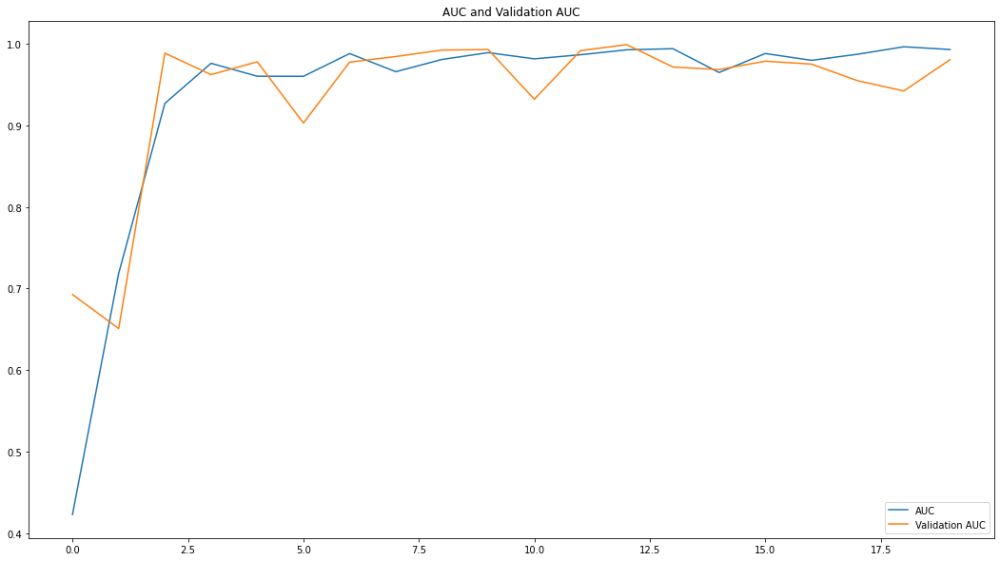

In [23]:
AUC = history['AUC']
val_AUC = history['val_AUC']
 
epochs_range = list(range(len((val_AUC))))
 
plt.figure(figsize=(40, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, AUC, label='AUC')
plt.plot(epochs_range, val_AUC, label='Validation AUC')
plt.legend(loc='lower right')
plt.title('AUC and Validation AUC')

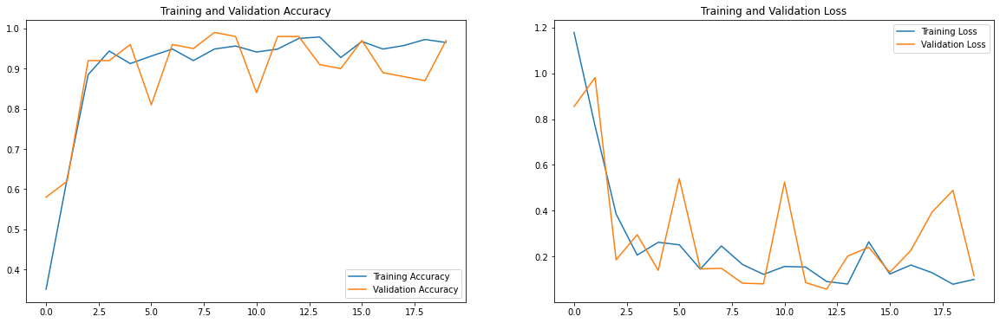

In [24]:
acc = history['accuracy']
val_acc = history['val_accuracy']
 
loss = history['loss']
val_loss = history['val_loss']
 
epochs_range = list(range(len((val_acc))))
 
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
 
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

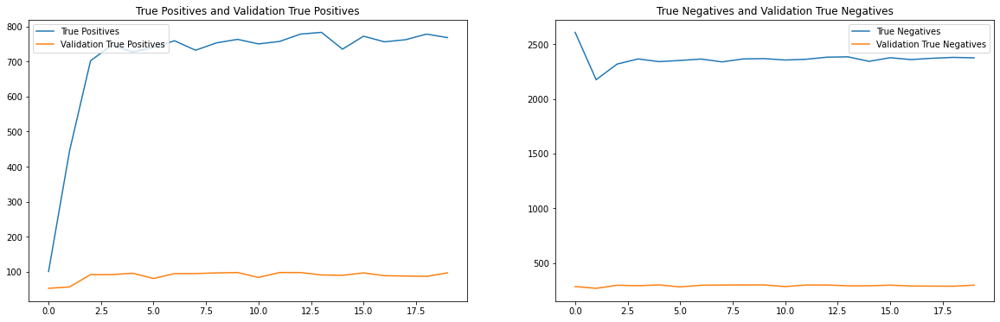

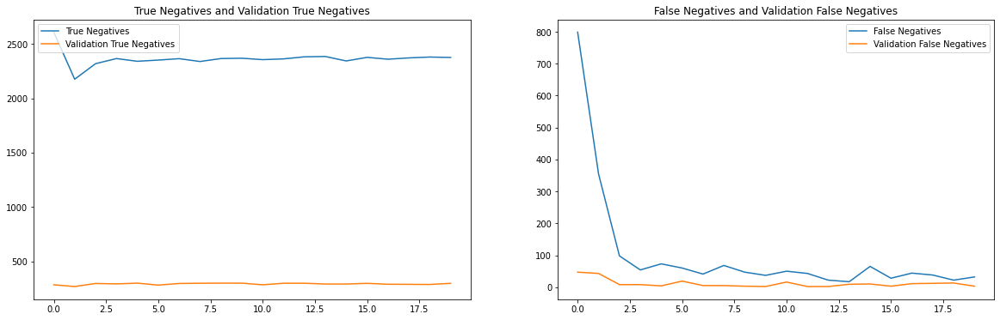

In [25]:
TP = history['TP']
val_TP = history['val_TP']
 
TN = history['TN']
val_TN = history['val_TN']

FP = history['FP']
val_FP = history['val_FP']

FN = history['FN']
val_FN = history['val_FN']
 
epochs_range = list(range(len((val_acc))))
 
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, TP, label='True Positives')
plt.plot(epochs_range, val_TP, label='Validation True Positives')
plt.legend(loc='upper left')
plt.title('True Positives and Validation True Positives')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, TN, label='True Negatives')
plt.plot(epochs_range, val_TN, label='Validation True Negatives')
plt.legend(loc='upper right')
plt.title('True Negatives and Validation True Negatives')
plt.show()

plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, TN, label='True Negatives')
plt.plot(epochs_range, val_TN, label='Validation True Negatives')
plt.legend(loc='upper left')
plt.title('True Negatives and Validation True Negatives')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, FN, label='False Negatives')
plt.plot(epochs_range, val_FN, label='Validation False Negatives')
plt.legend(loc='upper right')
plt.title('False Negatives and Validation False Negatives')
plt.show()

In [26]:
print("Accuracy: ",round(history['accuracy'][-1]*100, 2),"%")
print("Validation Accuracy: ",round(history['val_accuracy'][-1]*100, 2),"%")
print("Loss: ",history['loss'][-1])
print("Validation Loss: ",history['val_loss'][-1])


print("True Positives: ",history['TP'][-1])
print("True Negatives: ",history['TN'][-1])
print("Validation True Positives: ", history['val_TP'][-1])
print("Validation True Negatives: ", history['val_TN'][-1])

print("False Positives: ",history['FP'][-1])
print("False Negatives: ",history['FN'][-1])
print("Validation False Positives: ",history['val_FP'][-1])
print("Validation False Negatives: ",history['val_FN'][-1])


print("AUC: ",round(history['AUC'][-1]*100, 2),"%")
print("Validation AUC: ",round(history['val_AUC'][-1]*100, 2),"%")

Accuracy:  96.5 %
Validation Accuracy:  97.0 %
Loss:  0.10009758919477463
Validation Loss:  0.11649263650178909
True Positives:  768.0
True Negatives:  2375.0
Validation True Positives:  97.0
Validation True Negatives:  297.0
False Positives:  25.0
False Negatives:  32.0
Validation False Positives:  3.0
Validation False Negatives:  3.0
AUC:  99.3 %
Validation AUC:  98.05 %


# Evaluate the Model

In [28]:
model = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/Models/Markisa/Markisa.hdf5')

In [41]:
# Predict classes

img_width = 224
img_height = 224
test_data_path = '/tmp/Markisa_v2/Markisa_v2/testing_data/'

test_generator = ImageDataGenerator(rescale=1/255)
test_data_generator = test_generator.flow_from_directory(
    test_data_path, # Put your path here
     target_size=(img_width, img_height),
    batch_size=32,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model.predict(test_data_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)

Found 100 images belonging to 4 classes.


In [42]:
#Get ground-truth classes and class-labels

true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())   
class_labels_values = list(test_data_generator.class_indices.values())

                precision    recall  f1-score   support

 Markisa Besar       0.96      1.00      0.98        25
Markisa Kuning       1.00      0.96      0.98        25
 Markisa Manis       1.00      0.60      0.75        25
  Markisa Ungu       0.71      1.00      0.83        25

      accuracy                           0.89       100
     macro avg       0.92      0.89      0.89       100
  weighted avg       0.92      0.89      0.89       100



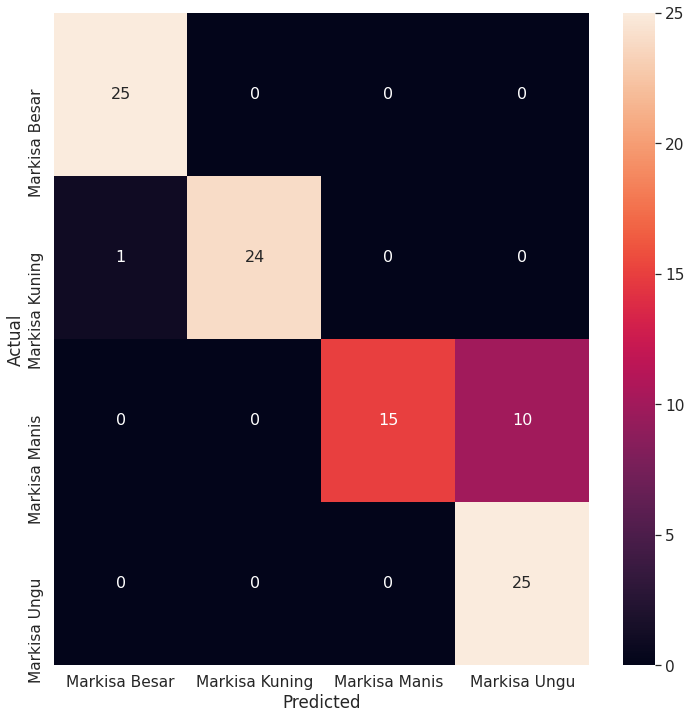

In [43]:
cm=confusion_matrix(true_classes, predicted_classes, labels=class_labels_values)
cm_df=pd.DataFrame(cm, index=class_labels, columns=class_labels)



report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

plt.figure(figsize=(12,12))
sn.set(font_scale=1.4) # for label size
sn.heatmap(cm_df, annot=True, annot_kws={"size": 16}, fmt='g') # font size
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide


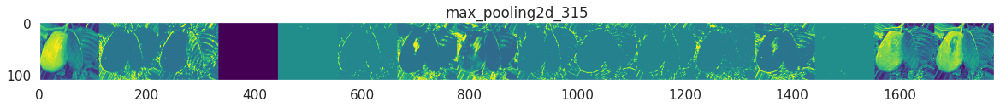

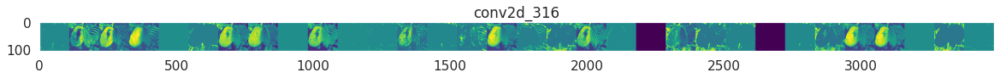

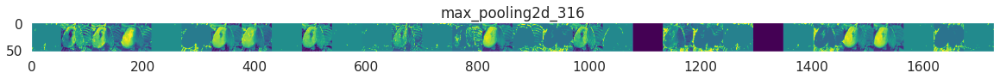

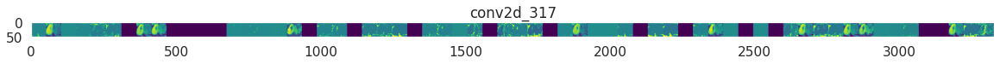

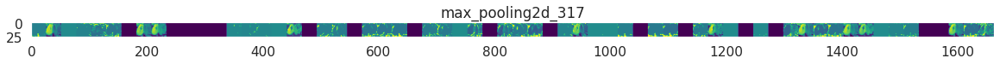

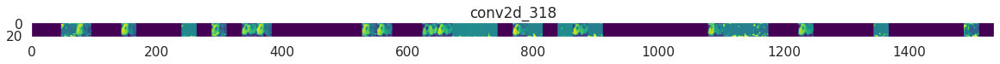

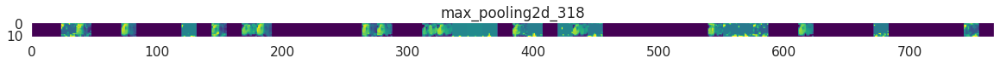

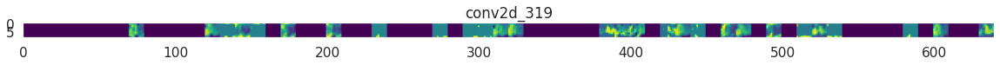

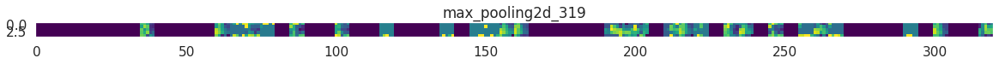

In [45]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Let's define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
# Let's prepare a random input image from the training set.

besar_pix = [os.path.join(train_besar_dir, fname) 
                for fname in train_besar_names]
kuning_pix = [os.path.join(train_kuning_dir, fname) 
                for fname in train_kuning_names]
manis_pix = [os.path.join(train_manis_dir, fname) 
                for fname in train_manis_names]
ungu_pix = [os.path.join(train_ungu_dir, fname) 
                for fname in train_ungu_names]


img_path = random.choice(besar_pix + kuning_pix + manis_pix + ungu_pix)

img = load_img(img_path, target_size=(224, 224))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# Rescale by 1/255
x /= 255

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers[1:]]

# Now let's display our representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    n_features = feature_map.shape[-1]  # number of features in feature map
    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      # Postprocess the feature to make it visually palatable
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
      # We'll tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [46]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

key = 0

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(224, 224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = list(model.predict(images, batch_size=1))
  flatten_x = np.concatenate(classes)
  print(classes[0])

  dictionary_class = list(train_generator.class_indices.keys())

  for i in range(len(flatten_x)):
    if flatten_x[i] == max(flatten_x):
      break
    else:
     key= key+1
     continue
  print(fn + " is " + dictionary_class[key])
